In [1]:
from sotip import *
import numpy as np
import scanpy as sc


In [2]:
fibro_path = 'path/to/SIMS_fibro'
health_path = 'path/to/SIMS_health'
fibro_file = f'{fibro_path}/data.h5ad'
health_file = f'{health_path}/data.h5ad'

In [3]:
adata_health = sc.read_h5ad(health_file)
adata_health.uns['final_cls_colors'] = [np.array(i) for i in adata_health.uns['final_cls_colors']]
adata_fibro = sc.read_h5ad(fibro_file)
adata_fibro.uns['test_reorder_colors'] = [np.array(i) for i in adata_fibro.uns['test_reorder_colors']]

# fibrosis analysis

In [4]:
adata_fibro = sc.read_h5ad('h5ad/fibro.h5ad')

# health analysis

In [5]:
adata_health = sc.read_h5ad('h5ad/health.h5ad')

In [7]:
adata_health

AnnData object with n_obs × n_vars = 706 × 244
    obs: 'pred', 'cls_8', 'cls_8_reorder', 'final_cls', 'typeidx', 'type', 'ct_name'
    uns: 'cls_8_colors', 'cls_8_reorder_colors', 'dendrogram_pred', 'final_cls_colors', 'pred_colors', 'rank_genes_groups', 'rep_list', 'type_colors'
    obsm: 'X_pca', 'X_umap', 'spatial'

# get ground distance

In [174]:
adata_fibro.obs['ct_name']

index
0      Kupffer cell
1       Immune cell
2       Immune cell
3       Immune cell
4        Fibroblast
           ...     
897    Kupffer cell
898      Hepatocyte
899    Kupffer cell
900      Hepatocyte
901      Hepatocyte
Name: ct_name, Length: 902, dtype: category
Categories (5, object): ['Endothelial cell', 'Fibroblast', 'Hepatocyte', 'Immune cell', 'Kupffer cell']

In [9]:
gd_method = 'paga_guided_umap'
cls_key = 'ct_name'
gd = get_ground_distance(adata_fibro,method=gd_method,cls_key=cls_key,embed_key=None,connect_threshold=0.5)  
# G,embed_center_distmat,adjacent_paga_bool = get_ground_distance(adata,method=gd_method,cls_key=cls_key,embed_key=None,connect_threshold=0.5)  


# concat fibro and health

In [176]:
adata_fibro.obs[cls_key]

index
0      Kupffer cell
1       Immune cell
2       Immune cell
3       Immune cell
4        Fibroblast
           ...     
897    Kupffer cell
898      Hepatocyte
899    Kupffer cell
900      Hepatocyte
901      Hepatocyte
Name: ct_name, Length: 902, dtype: category
Categories (5, object): ['Endothelial cell', 'Fibroblast', 'Hepatocyte', 'Immune cell', 'Kupffer cell']

In [10]:
adata_health.obs[cls_key] = adata_health.obs[cls_key].cat.set_categories(adata_fibro.obs[cls_key].cat.categories)

In [11]:
adata = adata_fibro.concatenate([adata_health])

In [12]:
adata.uns['GD'] = gd

#  MED

In [13]:
adata.obs[cls_key]

index
0-0          Kupffer cell
1-0           Immune cell
2-0           Immune cell
3-0           Immune cell
4-0            Fibroblast
               ...       
719-1          Hepatocyte
720-1    Endothelial cell
721-1          Hepatocyte
722-1          Hepatocyte
723-1          Hepatocyte
Name: ct_name, Length: 1608, dtype: category
Categories (5, object): ['Endothelial cell', 'Fibroblast', 'Hepatocyte', 'Immune cell', 'Kupffer cell']

In [14]:
adata.obs[cls_key].cat.categories

Index(['Endothelial cell', 'Fibroblast', 'Hepatocyte', 'Immune cell',
       'Kupffer cell'],
      dtype='object')

In [55]:
knn = 10
spatial_var='spatial'
ME_var_names_np_unique = np.array(adata.obs[cls_key].cat.categories)
MED_multi(adata,use_cls=cls_key,nn=knn,copy=False,ME_var_names_np_unique=ME_var_names_np_unique,spatial_var=spatial_var,batch_obs='batch')
# MED(adata,use_cls=cls_key,nn=knn,copy=False,ME_var_names_np_unique=ME_var_names_np_unique,spatial_var=spatial_var) 
  


knn search time cost 0.002508401870727539 s
0 MEs,time cost 1.9073486328125e-06 s, 902 MEs, 1.720428466796875e-06s left
knn search time cost 0.0019116401672363281 s
0 MEs,time cost 2.1457672119140625e-06 s, 706 MEs, 1.5149116516113281e-06s left


array([[ 0.,  4.,  0.,  5.,  1.],
       [ 0.,  4.,  0.,  5.,  1.],
       [ 0.,  5.,  0.,  5.,  0.],
       ...,
       [ 1.,  0.,  9.,  0.,  0.],
       [ 0.,  0., 10.,  0.,  0.],
       [ 1.,  0.,  9.,  0.,  0.]])

# heter

In [56]:
gd_method = 'paga_guided_umap'
heter_key = 'ME_heter_{0}_{1}'.format(cls_key,gd_method)

cal_ME_heterogeneity(adata,copy=False,key_added=heter_key) 

Trying to set attribute `._uns` of view, copying.


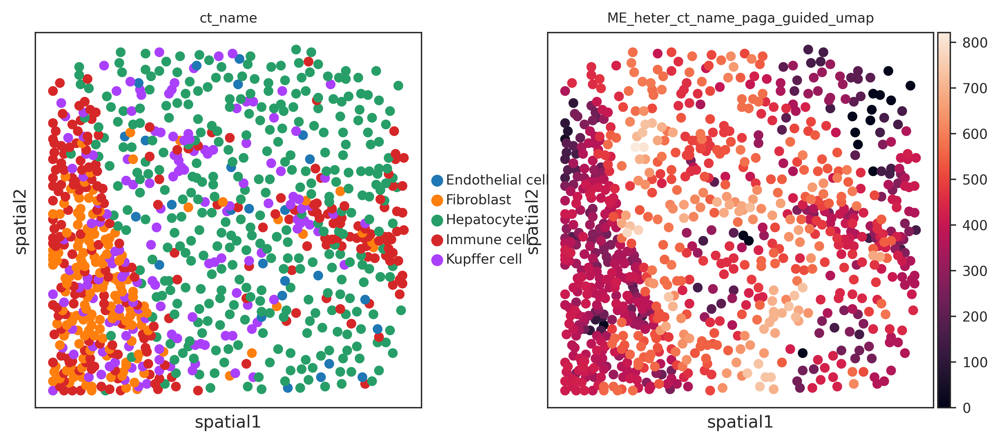

In [57]:
adata_plot = adata[adata.obs['batch']=='0']
sc.pl.embedding(adata_plot,basis='spatial',color=['ct_name',heter_key])

# EMD

In [58]:
adata_phEMD = MED_phEMD(
    adata.copy(),
    GD_method=gd_method,
    MED_knn=knn,
    CT_obs=cls_key,
    ifspatialplot=False,
    OT_method='pyemd',
    ME_precompyted=True,
    GD_precomputed=True
)


0 1639057277.3492546
100 4.948663711547852
200 4.613616466522217
300 4.291260480880737
400 3.9745335578918457
500 3.6429004669189453
600 3.4232423305511475
700 3.060826063156128
800 2.6834182739257812
900 2.2962324619293213
1000 1.947072982788086
1100 1.648017406463623
1200 1.356776475906372
1300 1.0633268356323242
1400 0.7675125598907471
1500 0.4707810878753662
1600 0.17336606979370117


# ME embedding

In [182]:
def make_EMD_neighbor(adata,emd_distmat,n_neighbors=100):
    # if adata.shape>=4096
    # emd_distmat = (adata_phEMD.obsm['X_ME_EMD_mat'])
    adata.obsp['ME_EMD_mat'] = emd_distmat

    # n_neighbors=100
    sc.pp.neighbors( adata, n_neighbors=n_neighbors, n_pcs=50)
    knn_indices, knn_dists, forest = sc.neighbors.compute_neighbors_umap( emd_distmat, n_neighbors=n_neighbors, metric='precomputed' )
    adata.obsp['distances'], adata.obsp['connectivities'] = sc.neighbors._compute_connectivities_umap(
        knn_indices,
        knn_dists,
        adata.shape[0],
        n_neighbors, # change to neighbors you plan to use
    )
    adata.uns['neighbors_EMD'] = adata.uns['neighbors'].copy()

In [102]:
# if adata.shape>=4096
emd_distmat = (adata_phEMD.obsm['X_ME_EMD_mat'])
adata.obsp['ME_EMD_mat'] = emd_distmat

n_neighbors=100
sc.pp.neighbors( adata, n_neighbors=n_neighbors, n_pcs=50)
knn_indices, knn_dists, forest = sc.neighbors.compute_neighbors_umap( emd_distmat, n_neighbors=n_neighbors, metric='precomputed' )
adata.obsp['distances'], adata.obsp['connectivities'] = sc.neighbors._compute_connectivities_umap(
    knn_indices,
    knn_dists,
    adata.shape[0],
    n_neighbors, # change to neighbors you plan to use
)
adata.uns['neighbors_EMD'] = adata.uns['neighbors'].copy()

In [260]:
adata

AnnData object with n_obs × n_vars = 1608 × 7
    obs: 'cls_5', 'cls_5_pca', 'cls_5_pca_reorder', 'fibro_dist', 'fibro_dist_mum', 'cls_5_pca_reorder_IMlast', 'test', 'test_reorder', 'ct_name', 'pred', 'cls_8', 'cls_8_reorder', 'final_cls', 'typeidx', 'type', 'batch', 'ME_heter_ct_name_paga_guided_umap', 'leiden_EMD', 'interest_mask', 'leiden_EMD_masked', 'leiden_EMD_merge', 'leiden_EMD_merge_masked'
    uns: 'GD', 'neighbors', 'neighbors_EMD', 'umap', 'leiden', 'leiden_EMD_colors', 'paga', 'leiden_EMD_sizes', 'batch_colors', 'leiden_EMD_masked_colors', 'leiden_EMD_merge_sizes', 'merge_cls_list', 'leiden_EMD_merge_masked_colors', 'leiden_EMD_merge_colors', 'ct_name_colors'
    obsm: 'X_pca', 'X_umap', 'spatial', 'ME', 'X_umap_EMD'
    obsp: 'ME_EMD_mat', 'distances', 'connectivities'

In [267]:
make_EMD_neighbor(adata,adata.obsp['ME_EMD_mat'],n_neighbors=200)

In [268]:
sc.tl.umap(adata,neighbors_key='neighbors_EMD')
adata.obsm['X_umap_EMD'] = adata.obsm['X_umap']
sc.tl.leiden(adata,neighbors_key='neighbors_EMD',key_added='leiden_EMD',resolution=1)

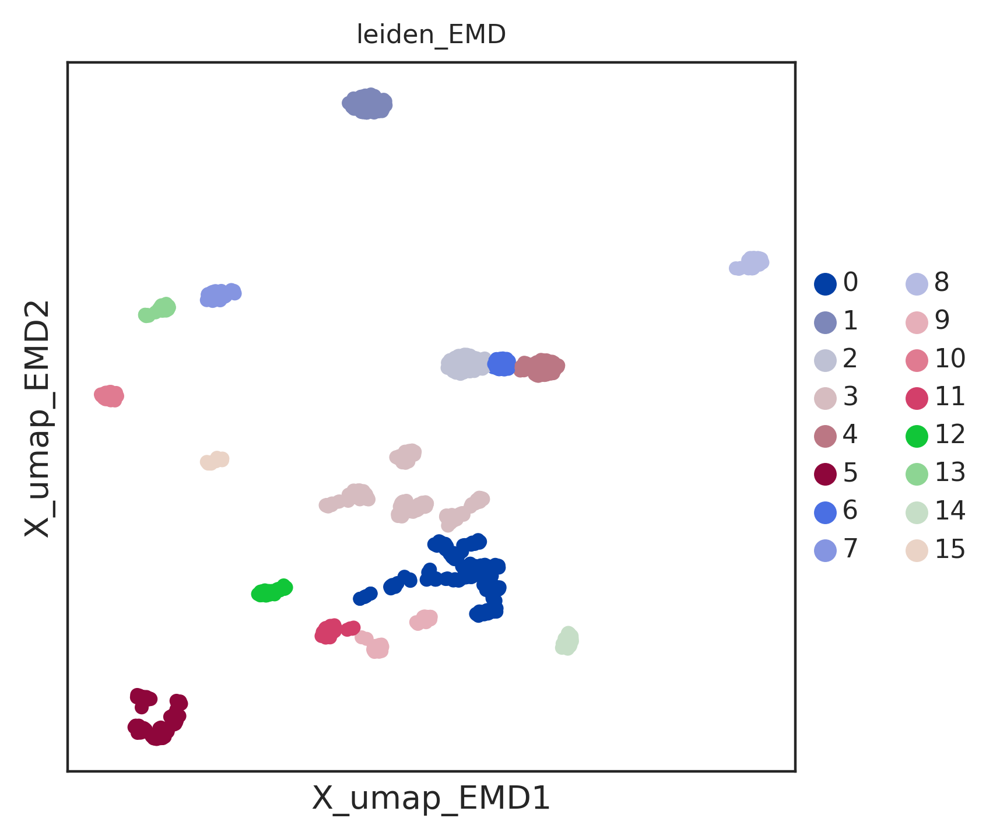

In [269]:
sc.pl.embedding(adata,basis='X_umap_EMD',color='leiden_EMD')

In [270]:
sc.tl.paga(adata,groups='leiden_EMD',neighbors_key='neighbors_EMD')

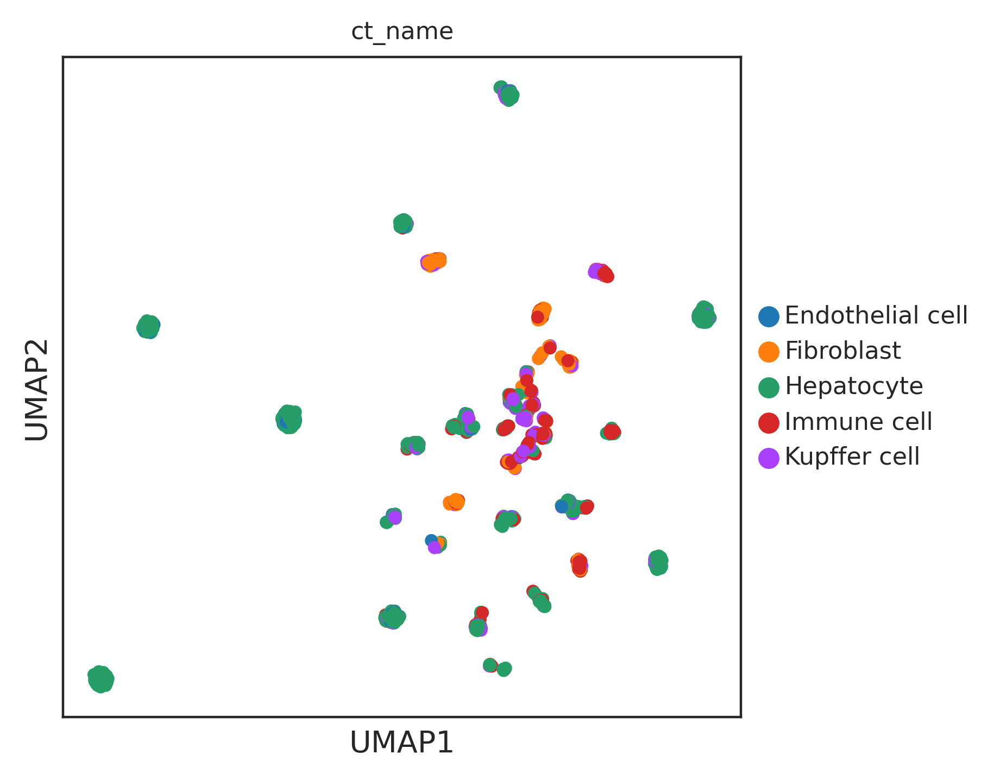

In [266]:
sc.pl.umap(adata,color=['ct_name'])

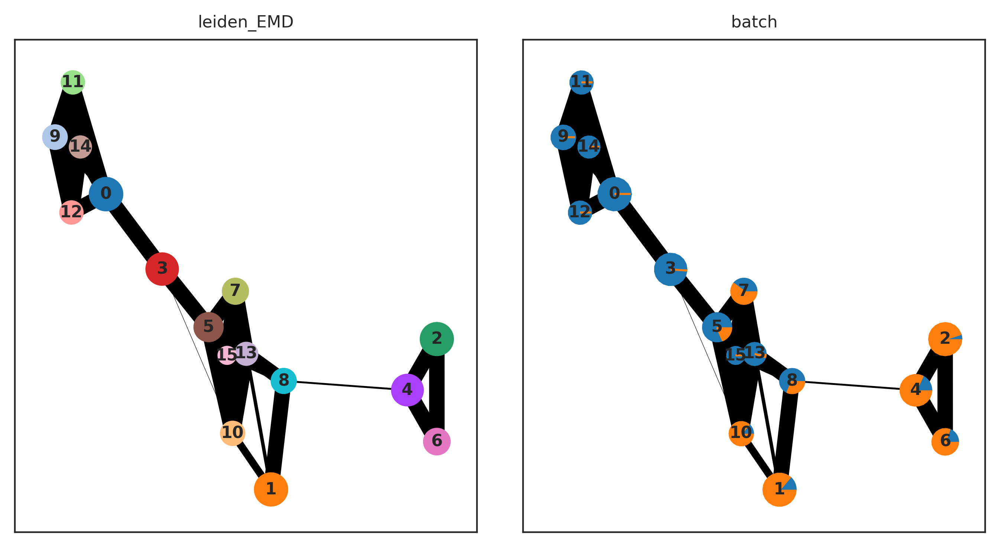

In [276]:
sc.pl.paga(adata,color=[ME_cls_obs,'batch'])

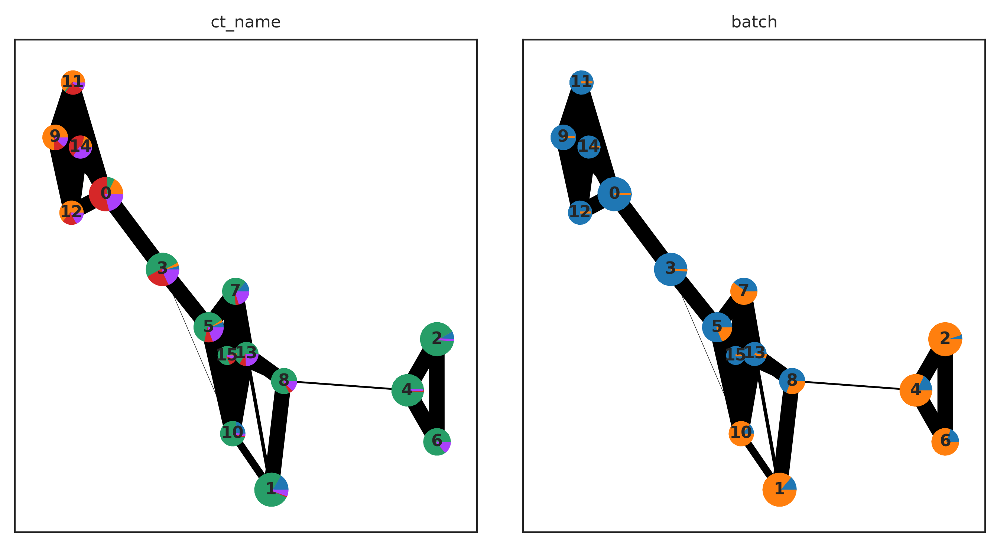

In [289]:
sc.pl.paga(adata,color=['ct_name','batch'])

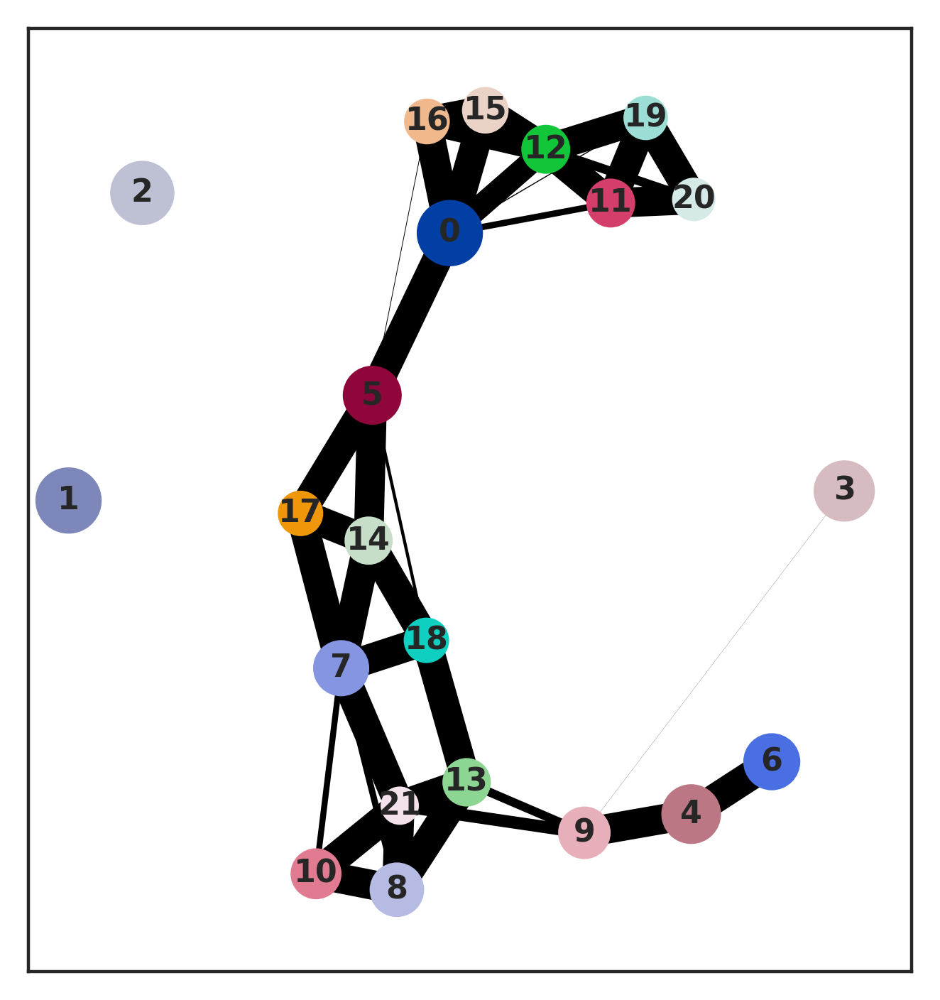

merged 0 to 5


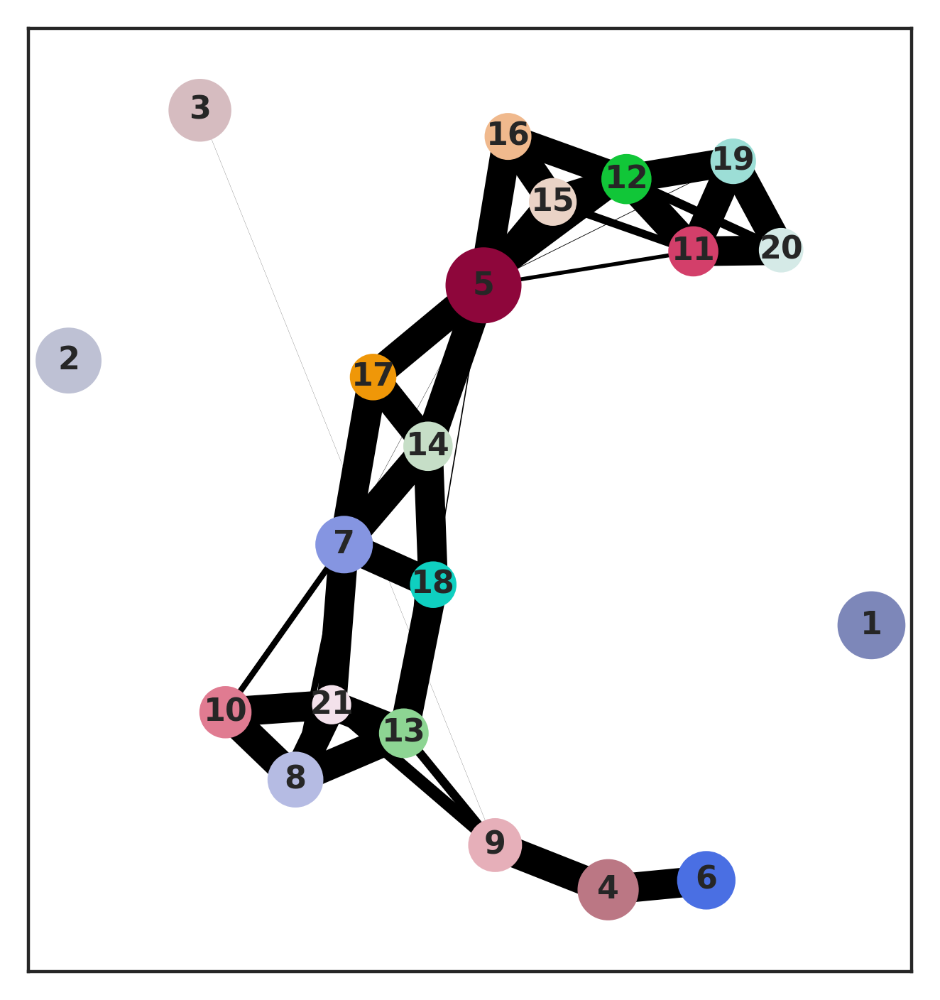

merged 4 to 6


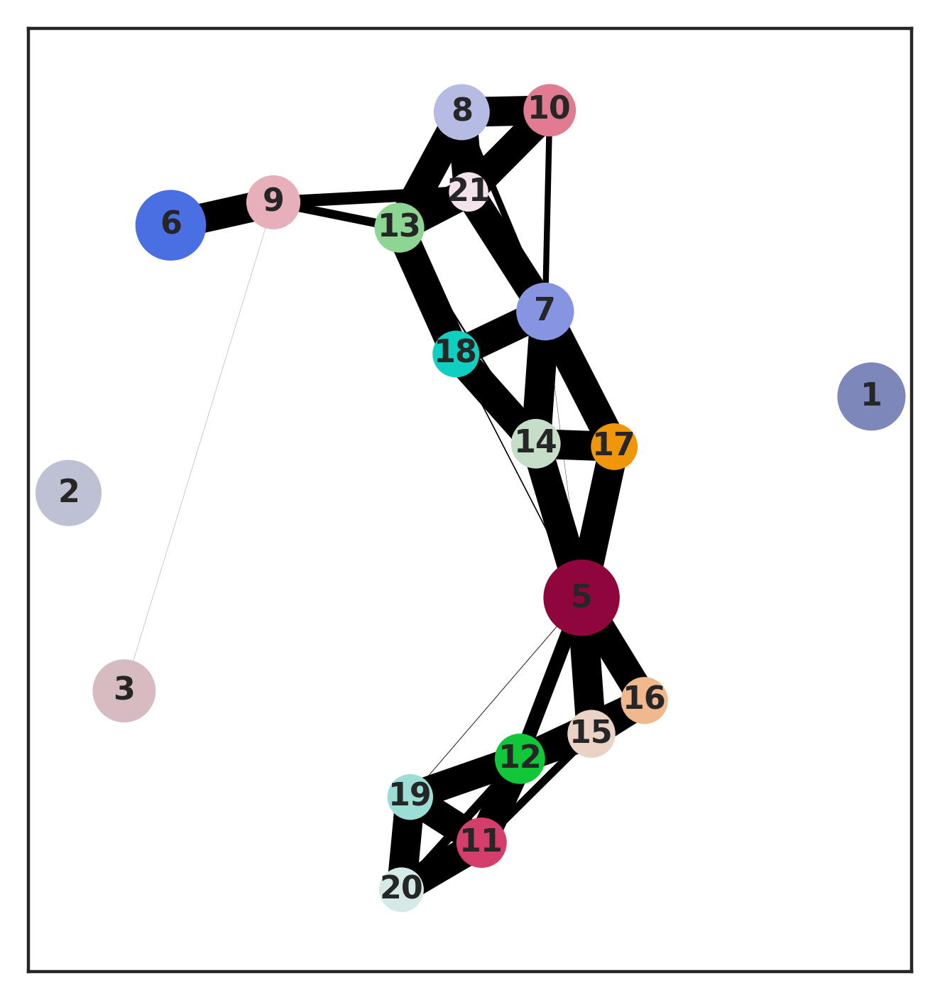

merged 5 to 14


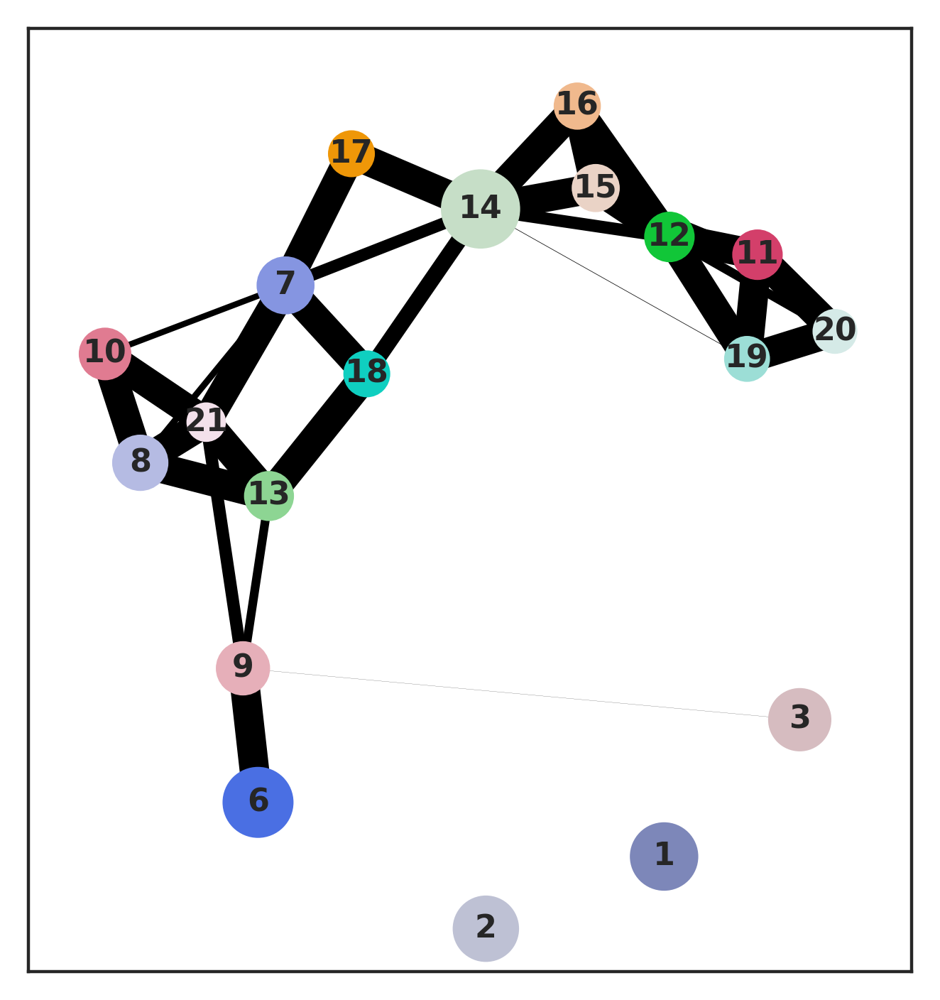

merged 6 to 9


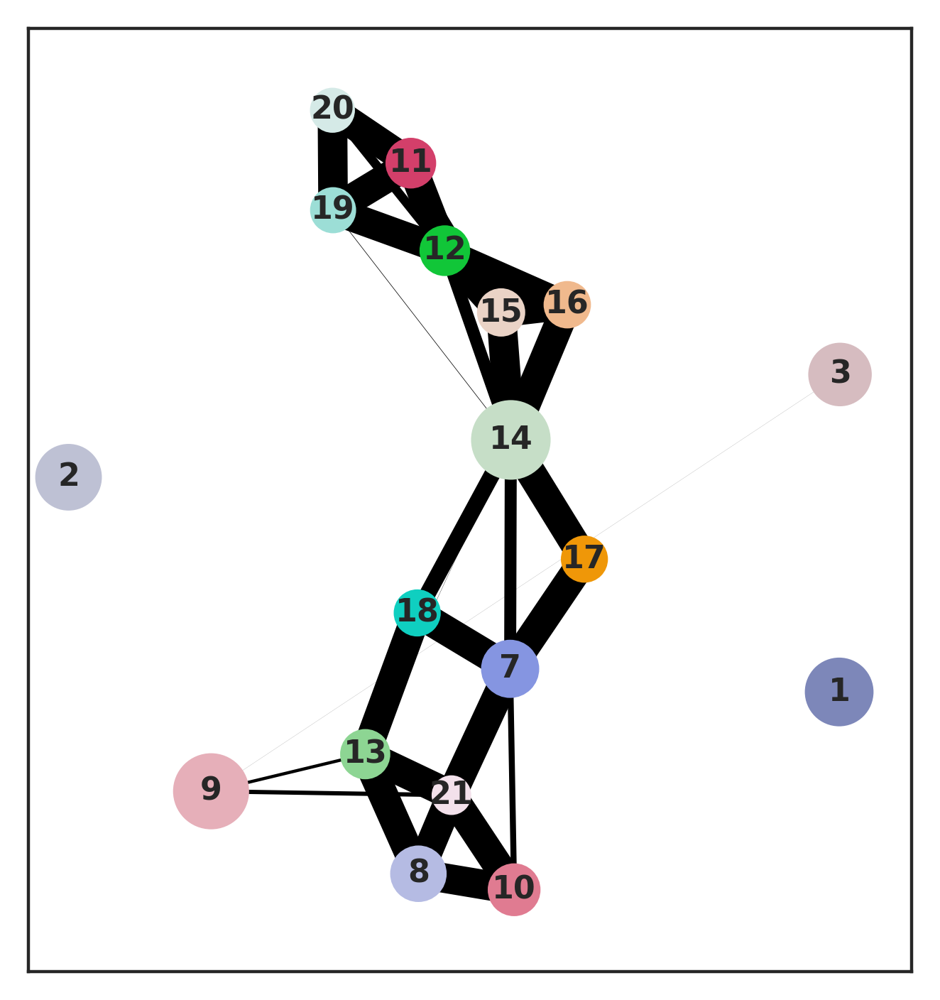

merged 7 to 17


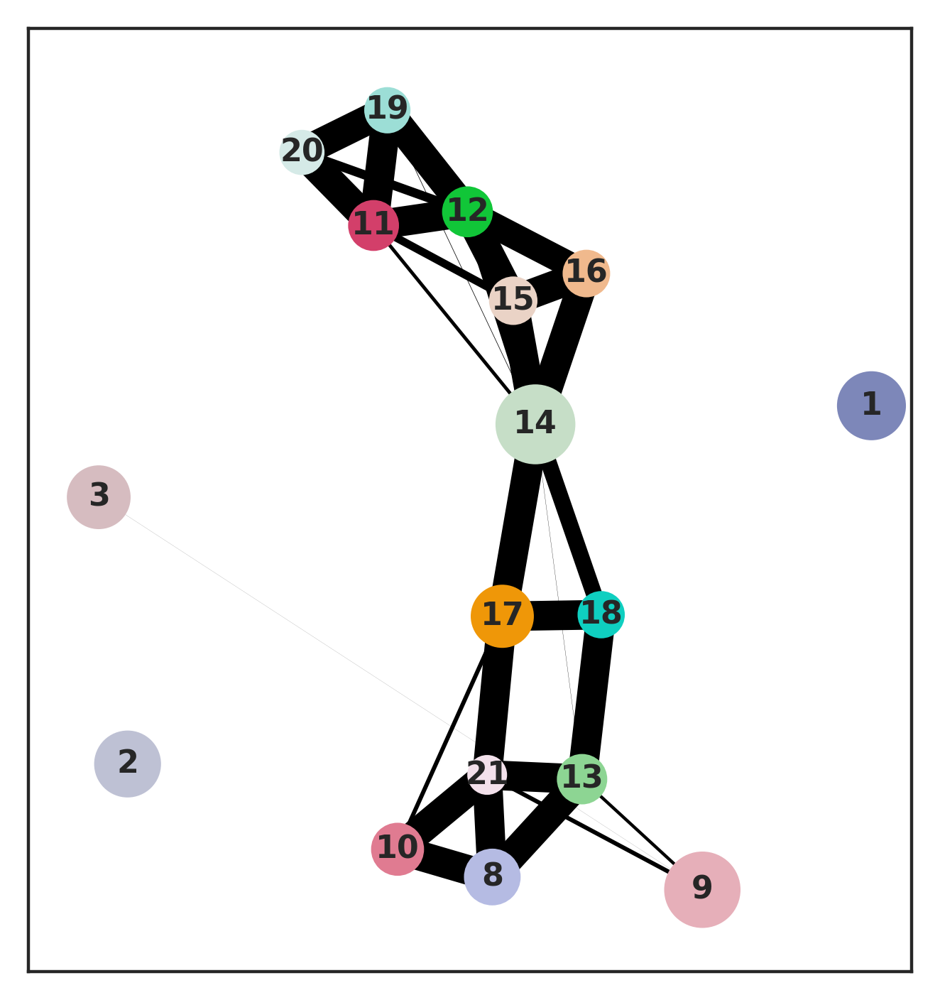

merged 8 to 10


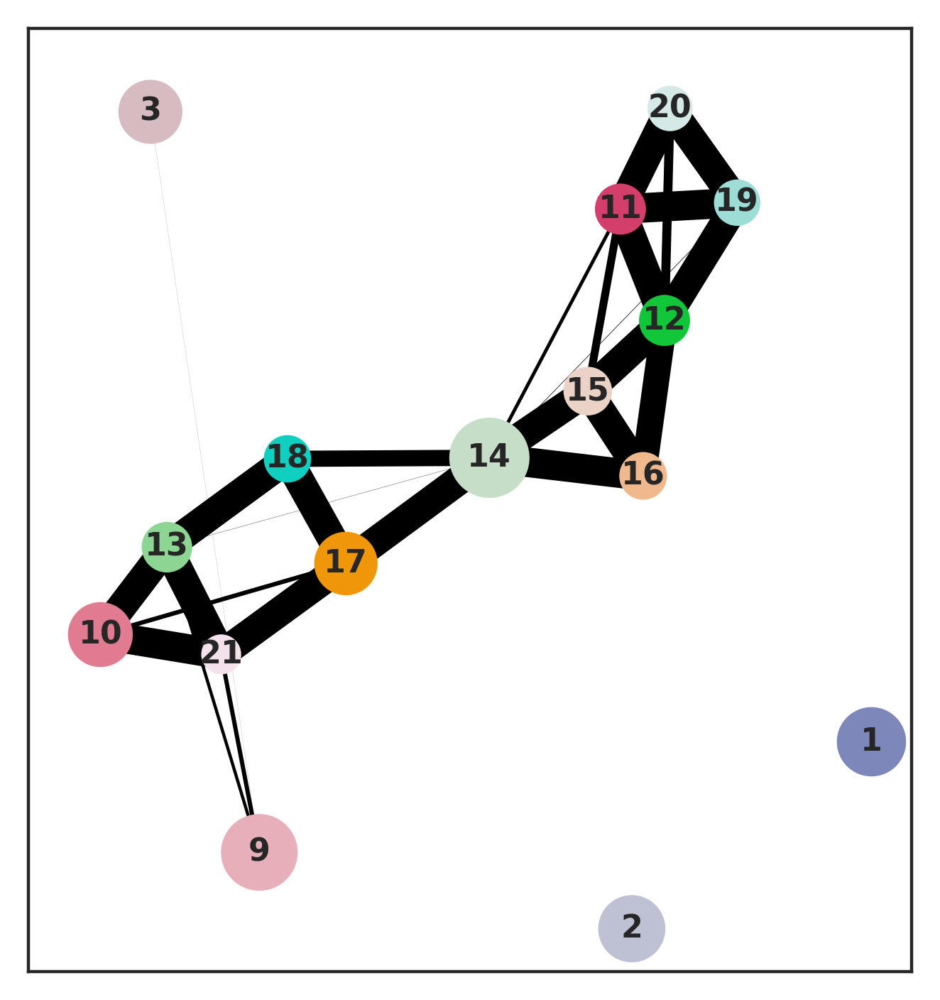

merged 10 to 13


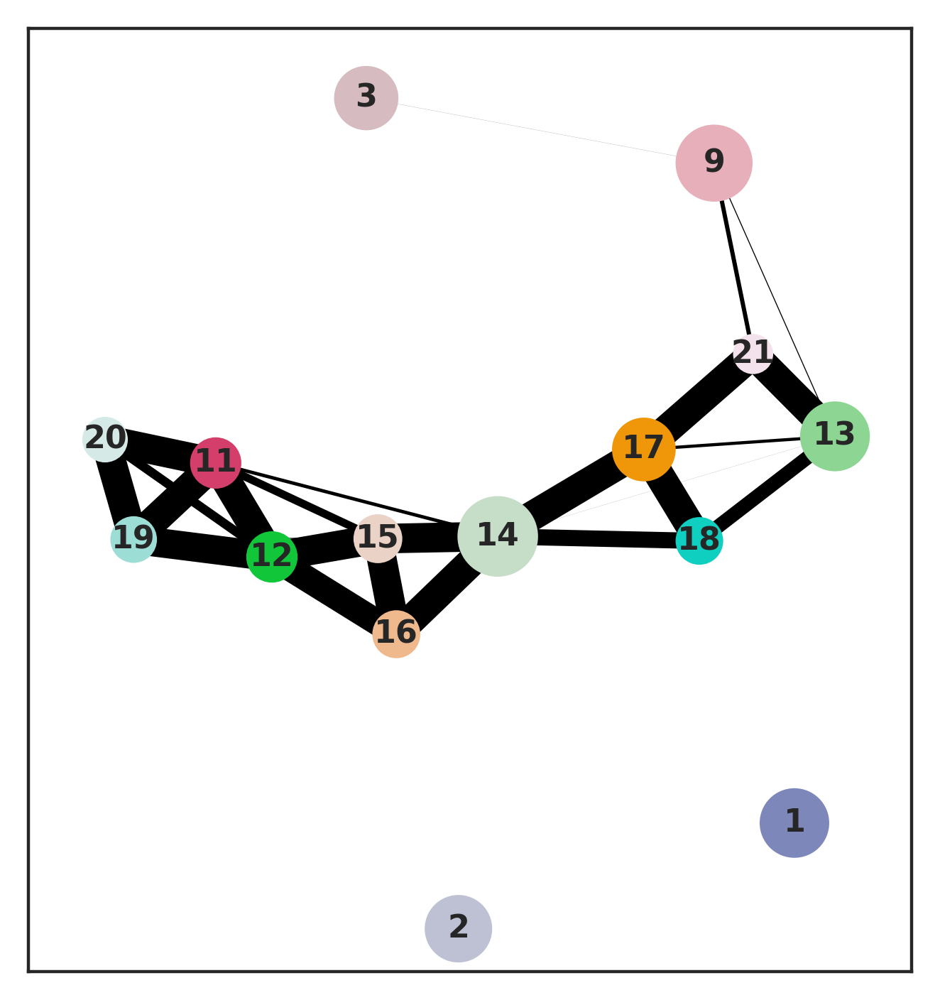

In [152]:
merge_cls_paga(adata,thresh=0,min_cls=15)

# select EH plot

In [272]:
# adata
heter_obs = heter_key
# ME_cls_obs = 'leiden_EMD'
ME_cls_obs = 'leiden_EMD'

batch_obs = 'batch'
EH_pd = get_EH_pd(adata,heter_obs,ME_cls_obs,batch_obs)

In [273]:
EH_pd

,ME_cls_no,heterogeneity,entropy_norm,entropy,size,batch_0_p,batch_1_p,batch_0_p_norm,batch_1_p_norm
0,0,389.095615,0.000000,0.000000,208,1.000000,0.000000,1.000000,0.000000
1,1,409.841458,0.505510,0.580597,202,0.138614,0.861386,0.111863,0.888137
2,2,236.324297,0.240295,0.286397,200,0.050000,0.950000,0.039565,0.960435
3,3,566.674731,0.105787,0.086891,183,0.989071,0.010929,0.986079,0.013921
4,4,14.575005,0.598236,0.676942,168,0.178571,0.821429,0.145411,0.854589
5,5,559.445498,0.768599,0.690624,119,0.815126,0.184874,0.775332,0.224668
6,6,198.860193,0.637986,0.716962,81,0.197531,0.802469,0.161542,0.838458
7,7,495.196032,0.927553,0.970951,75,0.400000,0.600000,0.342885,0.657115
8,8,329.516083,0.948642,0.896038,64,0.687500,0.312500,0.632616,0.367384
9,9,280.747800,0.000000,0.000000,59,1.000000,0.000000,1.000000,0.000000


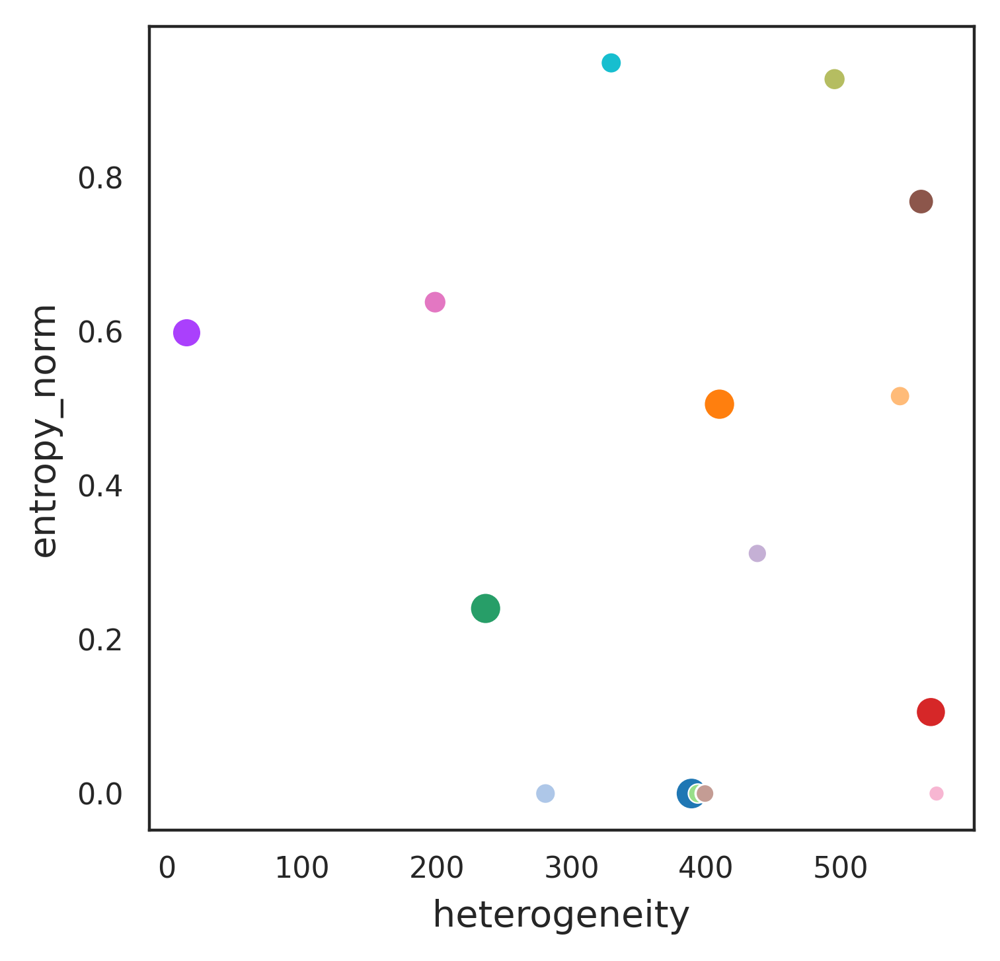

In [300]:
# EH_pd
# ME_cls_obs = 'leiden_EMD'
# ME_cls_obs = 'leiden_EMD_merge'

ax = sns.scatterplot(data=EH_pd,x='heterogeneity',y='entropy_norm',size='size',hue='ME_cls_no',palette=adata.uns[f'{ME_cls_obs}_colors'])
ax.get_legend().remove()

# for line in range(0,EH_pd.shape[0]):
#      plt.text(EH_pd['heterogeneity'][line]+0.2, EH_pd['entropy_norm'][line], EH_pd['ME_cls_no'][line], horizontalalignment='left', size=4, color='black', weight='semibold')


In [327]:
intest_ME = np.array(EH_pd[EH_pd['entropy_norm']<0.2]['ME_cls_no'])

In [328]:
intest_ME

array(['0', '3', '9', '11', '12', '14', '15'], dtype=object)

In [147]:
intest_ME = np.array(['16','20'])

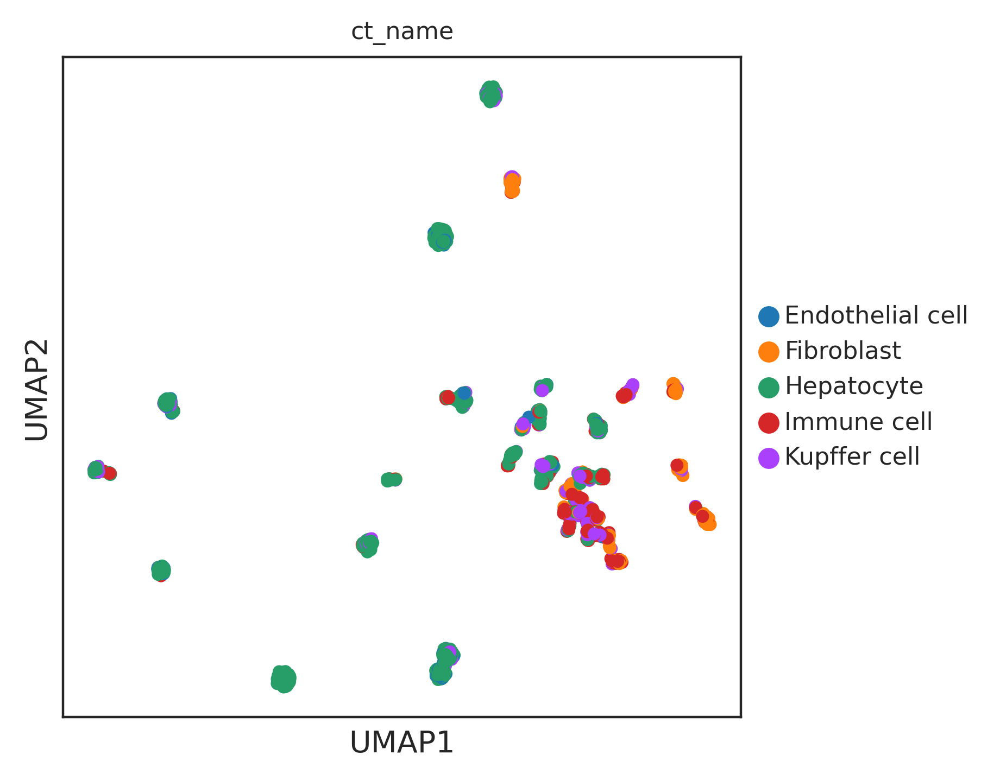

In [171]:
sc.pl.umap(adata,color=['ct_name'])

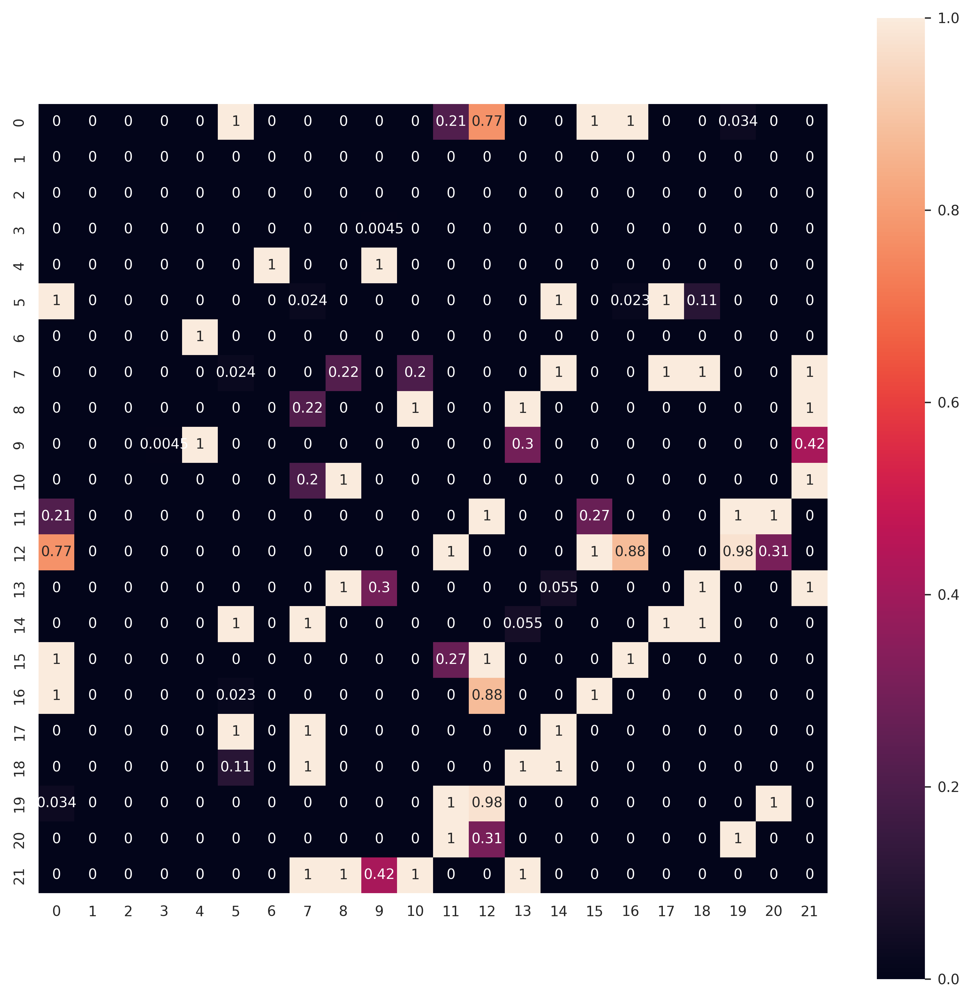

In [180]:
plot_matrix(adata.uns['paga']['connectivities'].toarray())

In [181]:
1+1

2

In [177]:
len(adata.obs[ME_cls_obs].cat.categories)

22

# plot ME bar plot

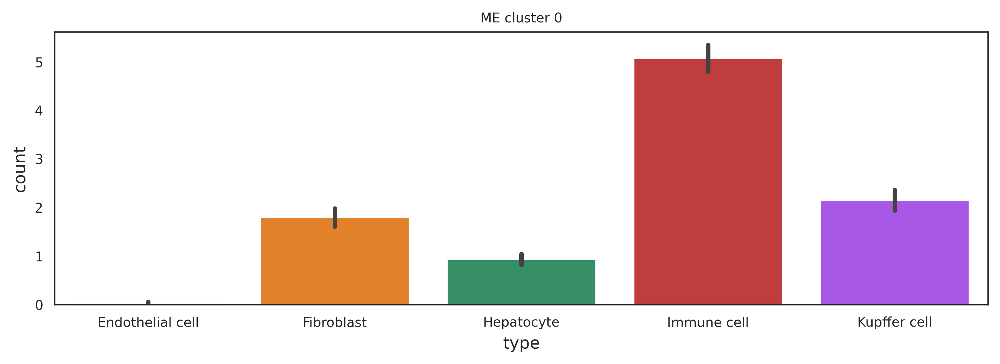

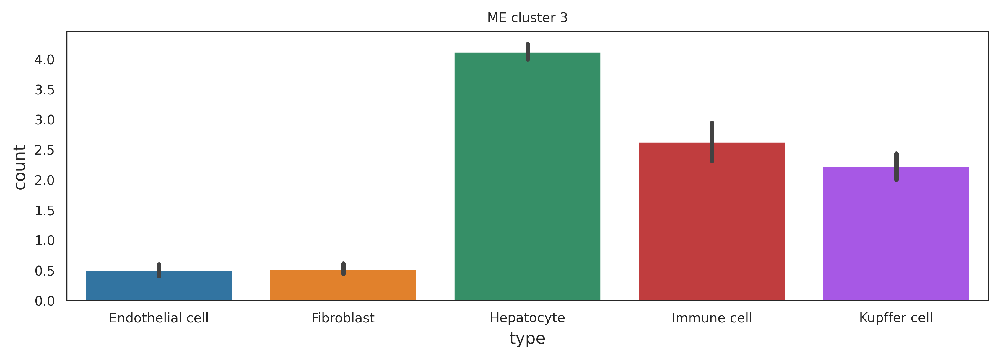

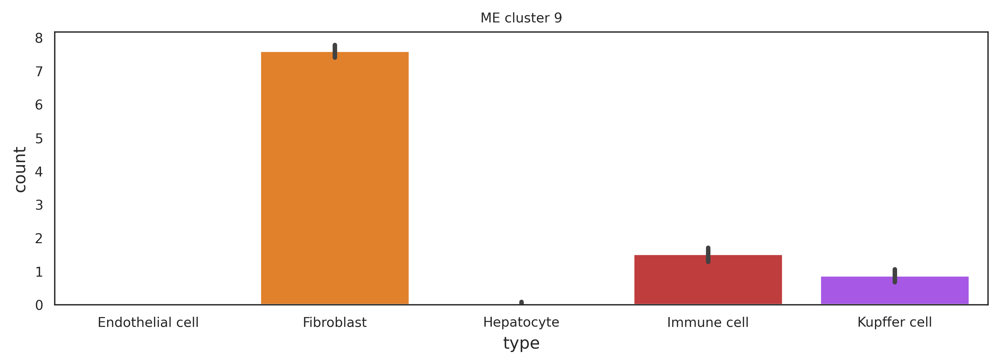

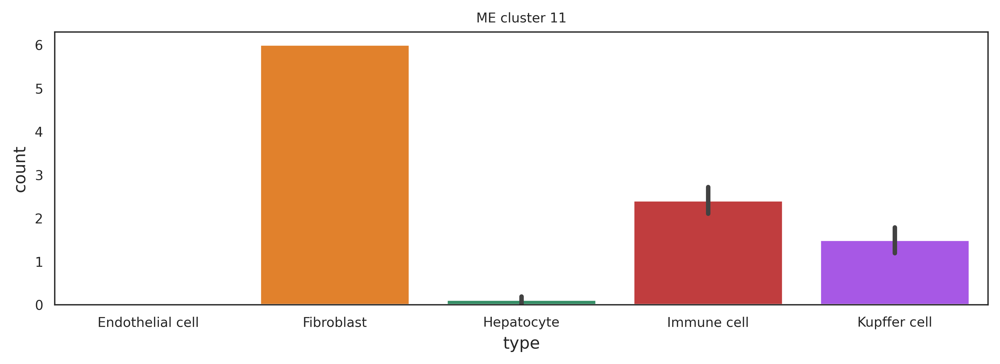

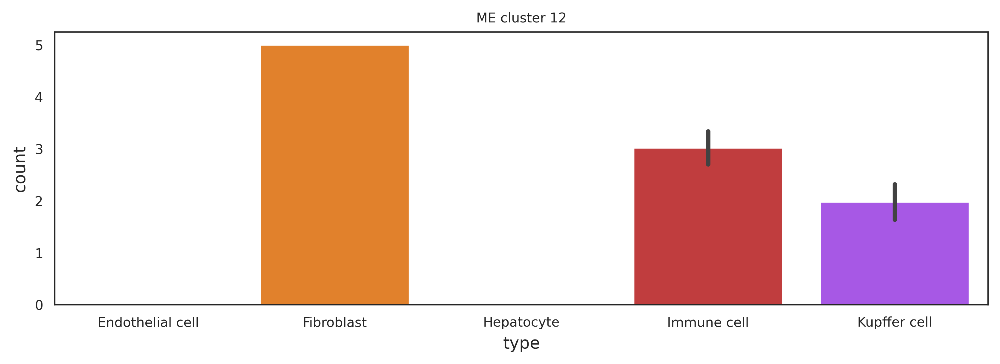

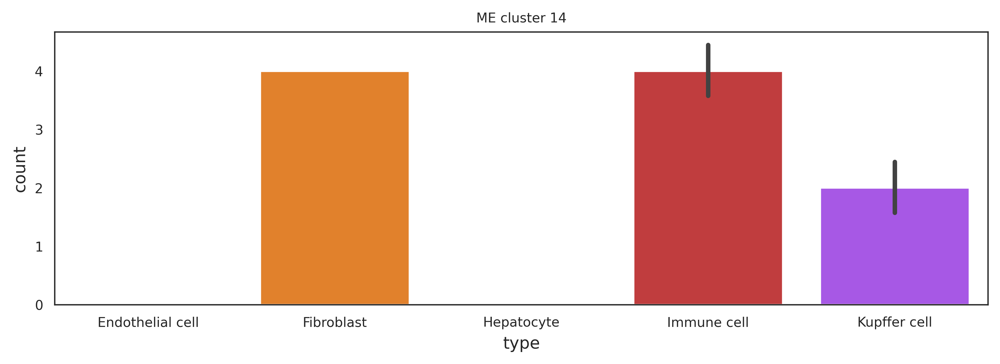

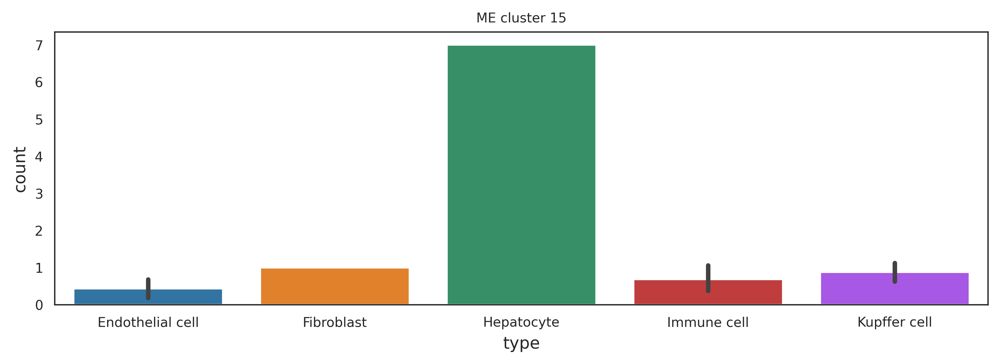

In [329]:
for i in intest_ME:
    plot_ME_cluster(adata,i,ME_cls_obs,'ct_name')

# plot interested ME [0,9,11,12,14]

In [308]:
intest_ME = ['0','9','11','12','14']


### plot merge color

In [303]:
interest_ME_cell_idx = np.where(adata.obs[ME_cls_obs].isin(intest_ME))[0]

In [304]:
interest_mask = np.zeros(shape=(adata.shape[0]))
interest_mask[interest_ME_cell_idx] = 1

In [305]:
adata.obs['interest_mask'] = interest_mask
adata.obs['interest_mask'] = adata.obs['interest_mask'].astype('category')

Trying to set attribute `._uns` of view, copying.


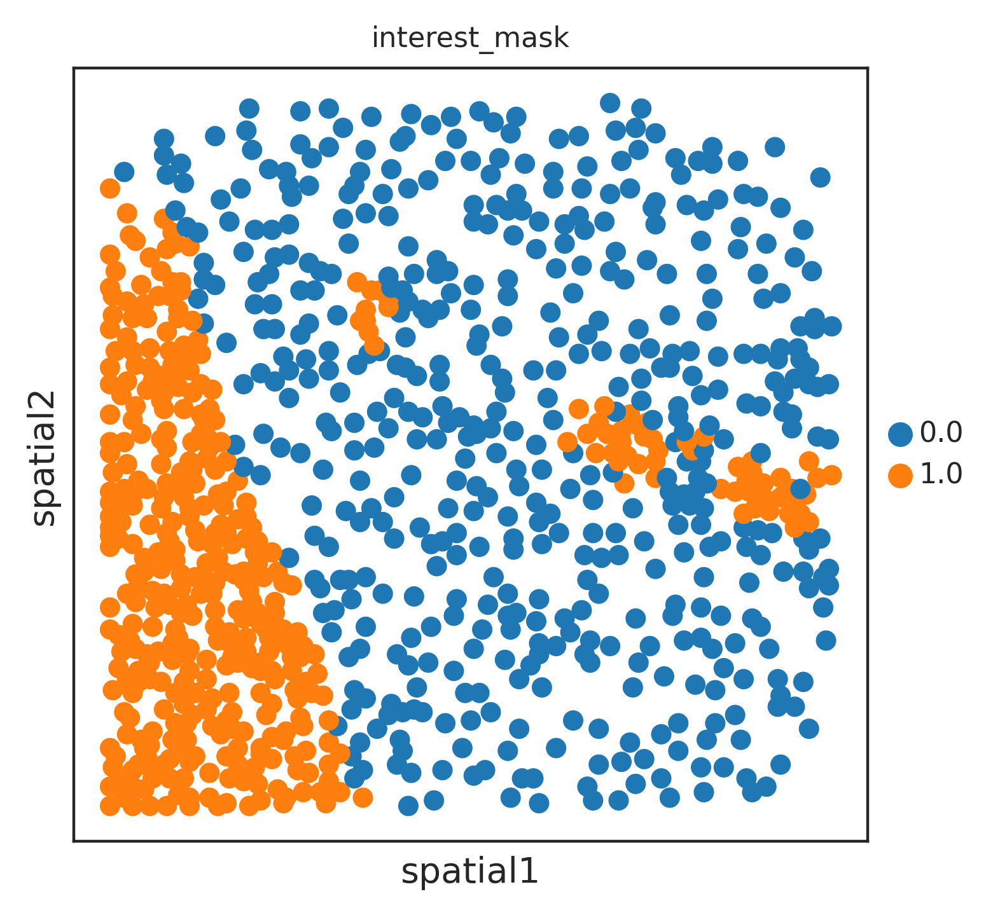

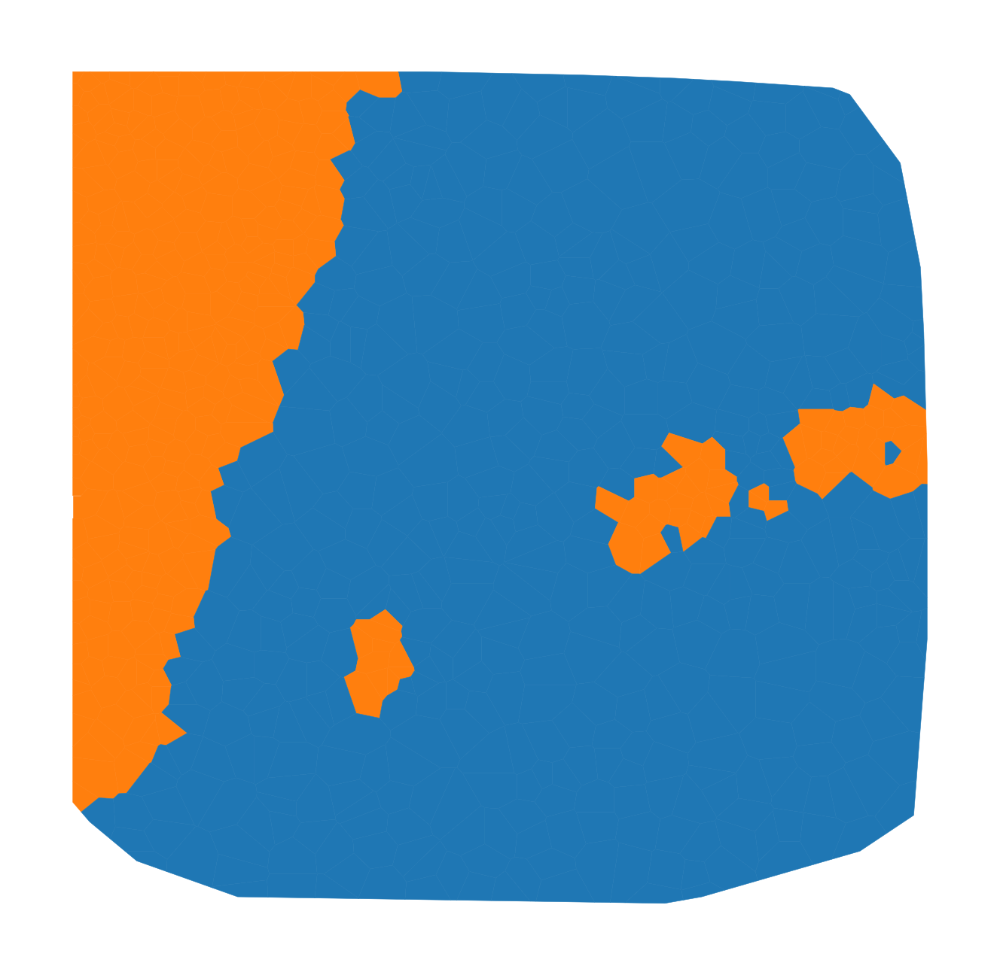

In [306]:
adata_plot = adata[adata.obs['batch']=='0']

# cls_obs = 'interest_mask'
# spatial_obs = 'spatial'
plot_voronoi_by_adata(adata_plot,'interest_mask','spatial')

### plot not merge color

In [309]:
mask_adata_by_obs(adata,intest_ME,ME_cls_obs)

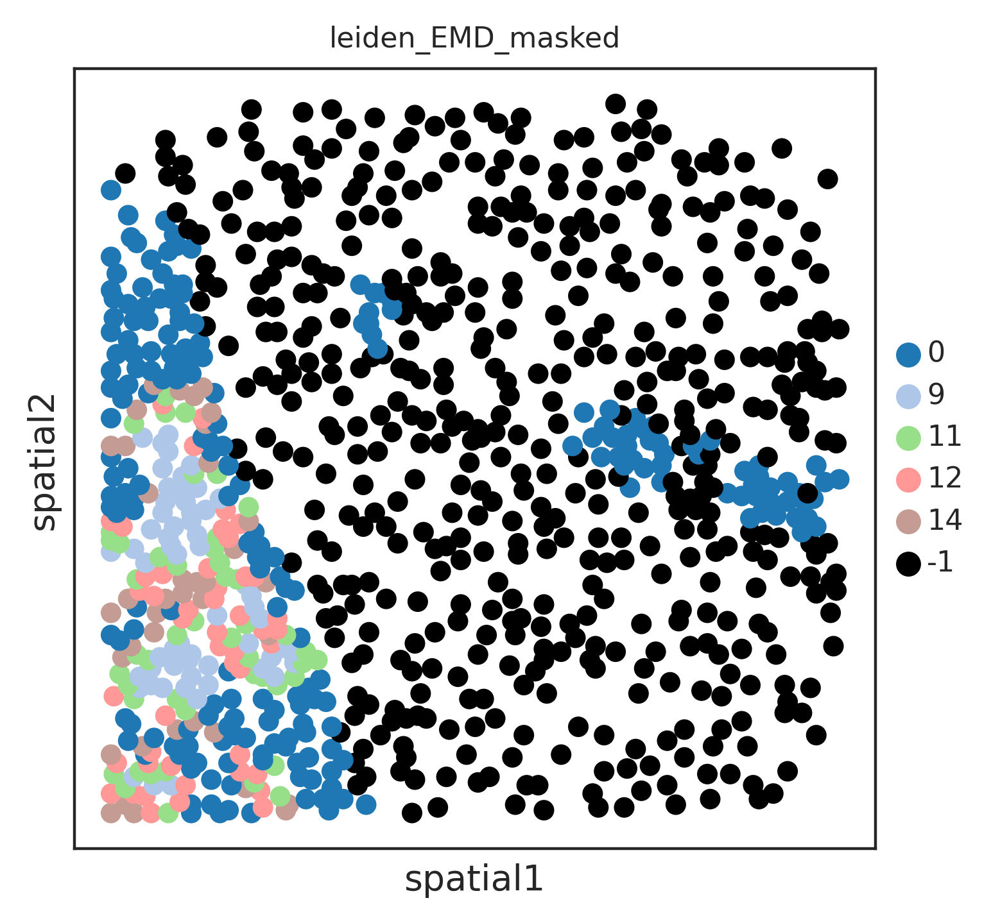

Trying to set attribute `.obsm` of view, copying.


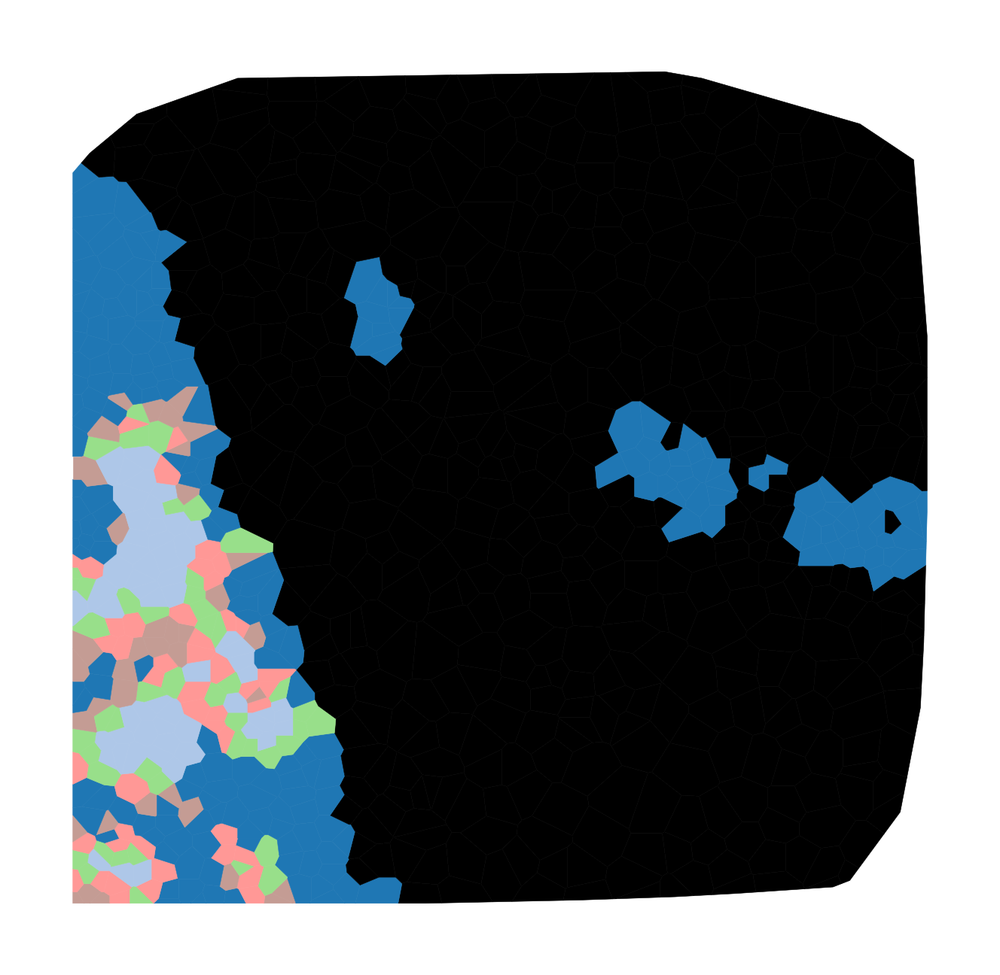

In [310]:
adata_plot = adata[adata.obs['batch']=='0']
masked_obs = ME_cls_obs
# cls_obs = 'interest_mask'
# spatial_obs = 'spatial'
plot_voronoi_by_adata(adata_plot,f'{masked_obs}_masked','spatial')

# plot interested ME [15]

In [313]:
intest_ME = ['15']


### plot merge color

In [314]:
interest_ME_cell_idx = np.where(adata.obs[ME_cls_obs].isin(intest_ME))[0]

In [315]:
interest_mask = np.zeros(shape=(adata.shape[0]))
interest_mask[interest_ME_cell_idx] = 1

In [316]:
adata.obs['interest_mask'] = interest_mask
adata.obs['interest_mask'] = adata.obs['interest_mask'].astype('category')

Trying to set attribute `._uns` of view, copying.


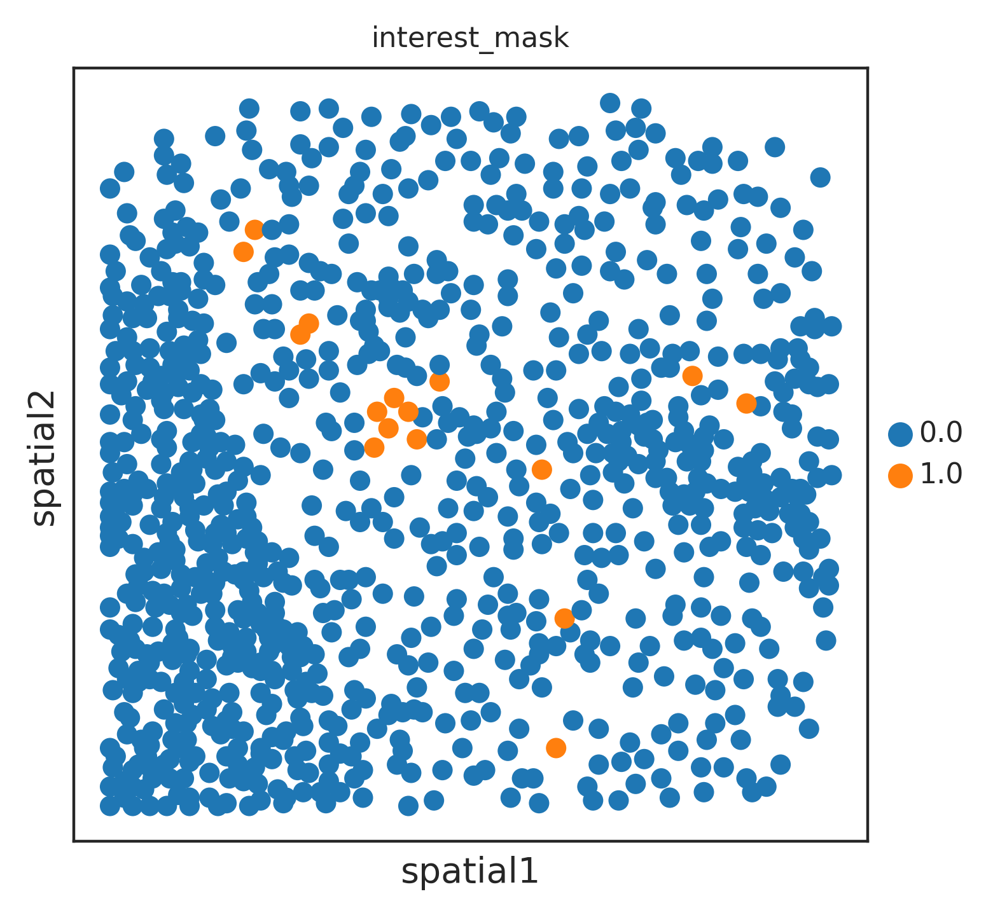

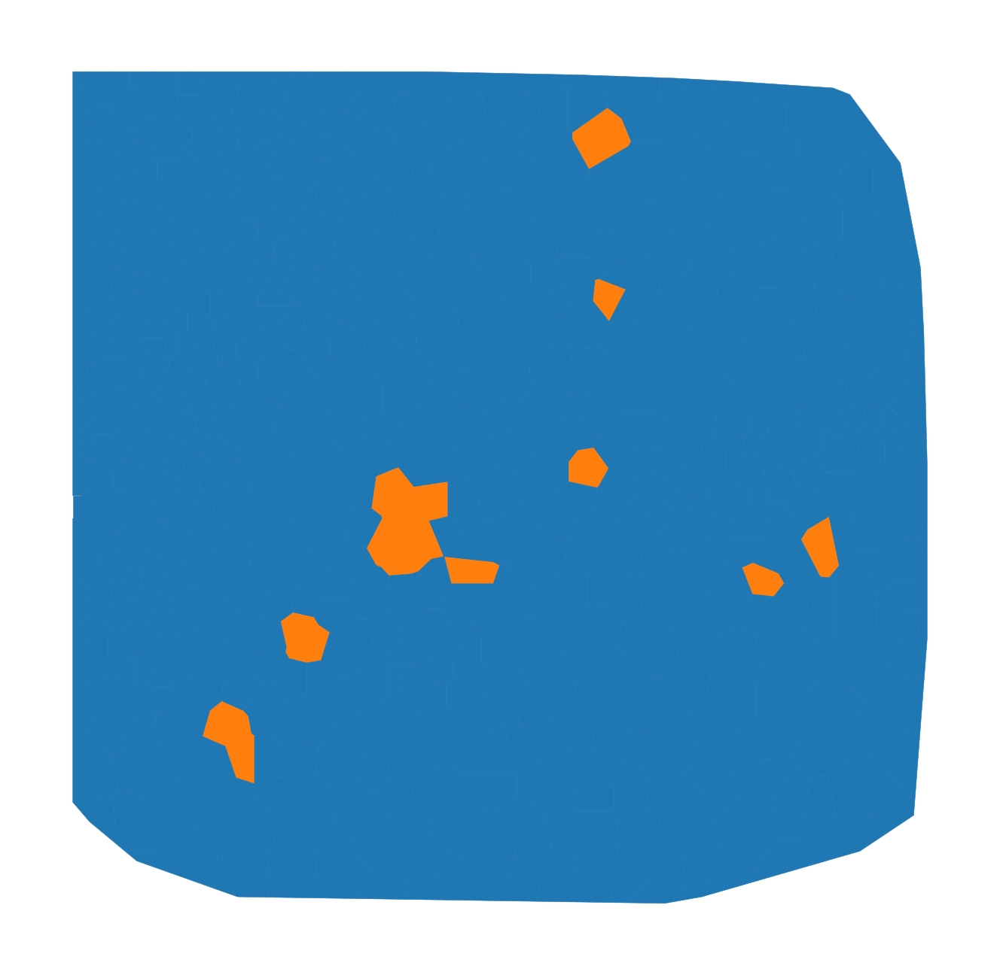

In [317]:
adata_plot = adata[adata.obs['batch']=='0']

# cls_obs = 'interest_mask'
# spatial_obs = 'spatial'
plot_voronoi_by_adata(adata_plot,'interest_mask','spatial')

### plot not merge color

In [318]:
mask_adata_by_obs(adata,intest_ME,ME_cls_obs)

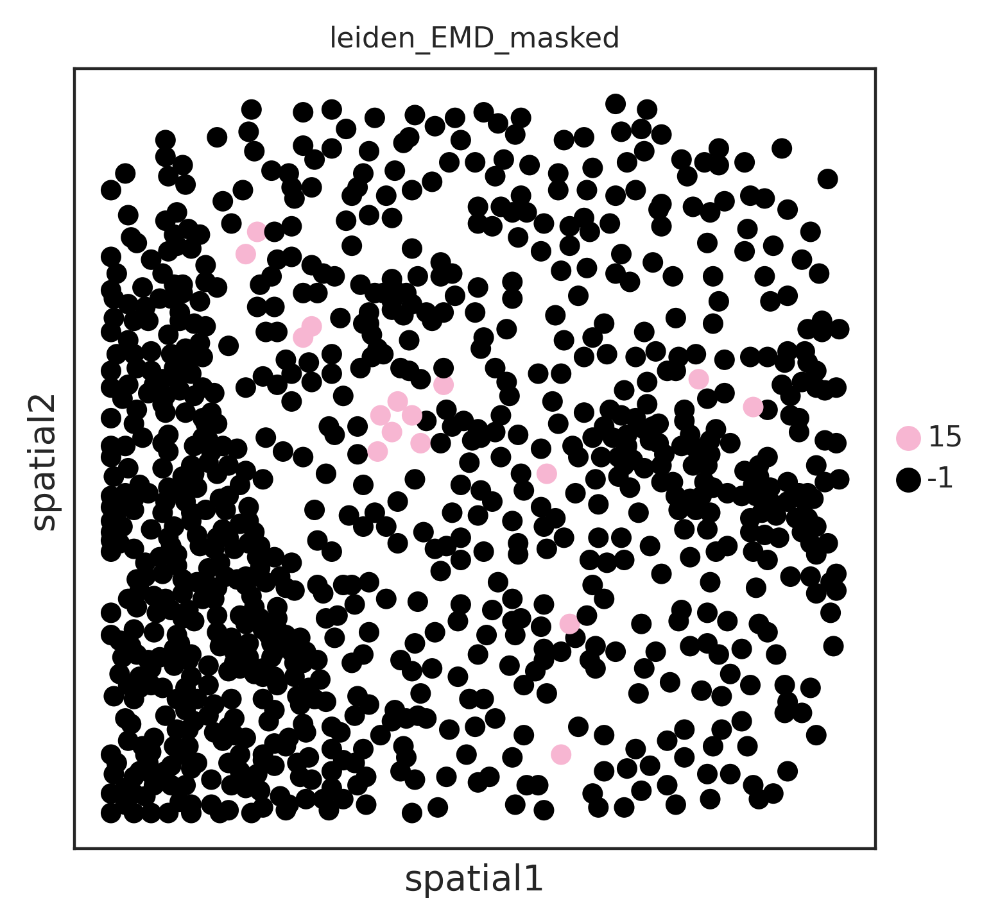

Trying to set attribute `.obsm` of view, copying.


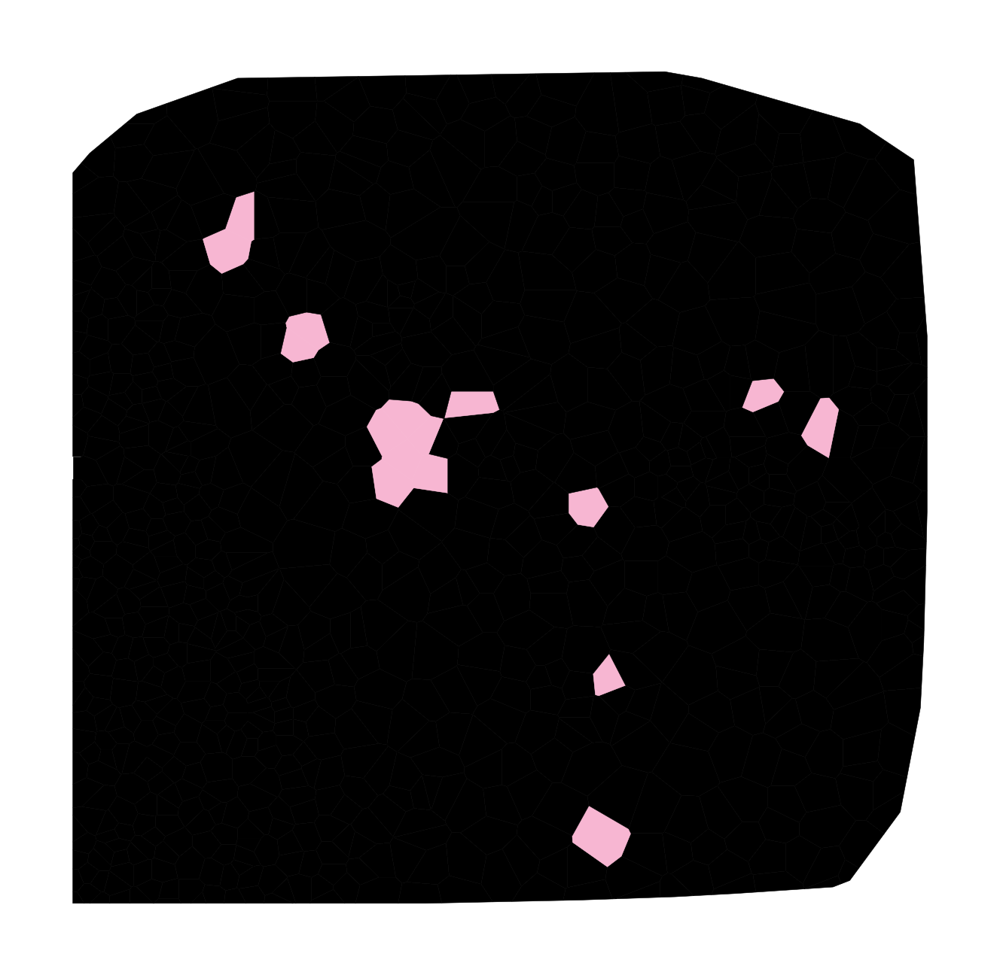

In [319]:
adata_plot = adata[adata.obs['batch']=='0']
masked_obs = ME_cls_obs
# cls_obs = 'interest_mask'
# spatial_obs = 'spatial'
plot_voronoi_by_adata(adata_plot,f'{masked_obs}_masked','spatial')

# plot interested ME [3]

In [320]:
intest_ME = ['3']


### plot merge color

In [321]:
interest_ME_cell_idx = np.where(adata.obs[ME_cls_obs].isin(intest_ME))[0]

In [322]:
interest_mask = np.zeros(shape=(adata.shape[0]))
interest_mask[interest_ME_cell_idx] = 1

In [323]:
adata.obs['interest_mask'] = interest_mask
adata.obs['interest_mask'] = adata.obs['interest_mask'].astype('category')

Trying to set attribute `._uns` of view, copying.


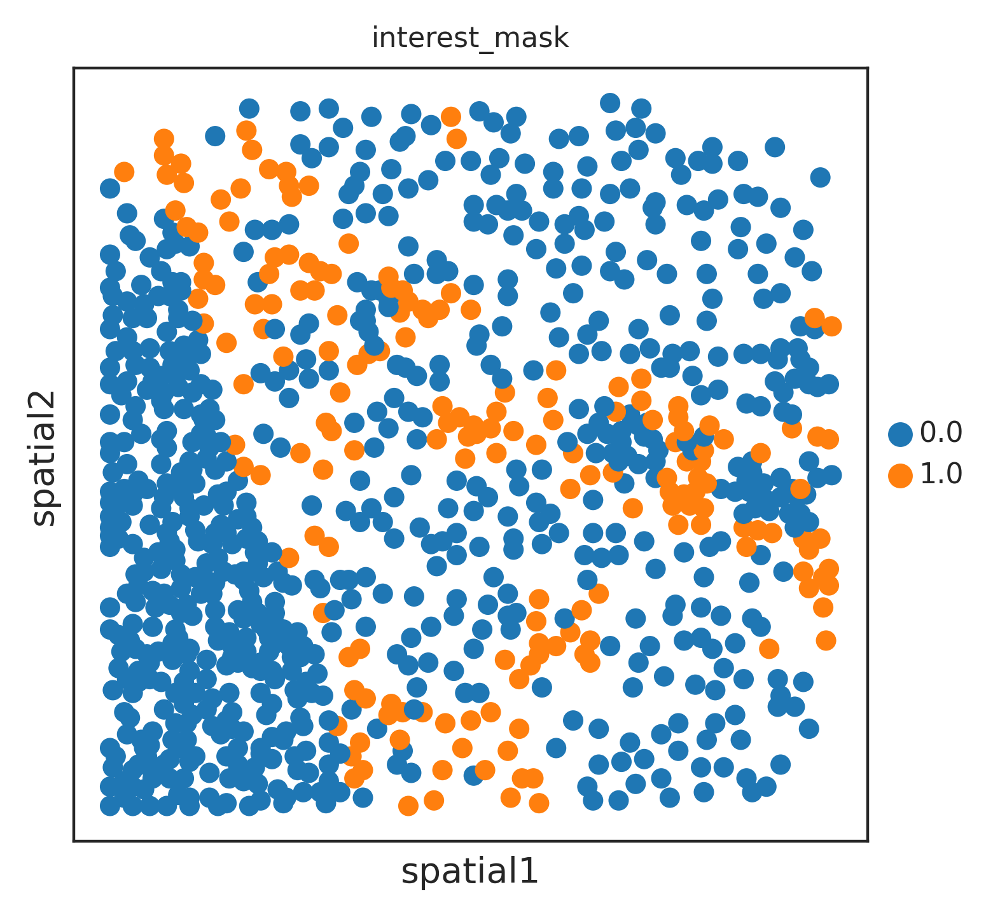

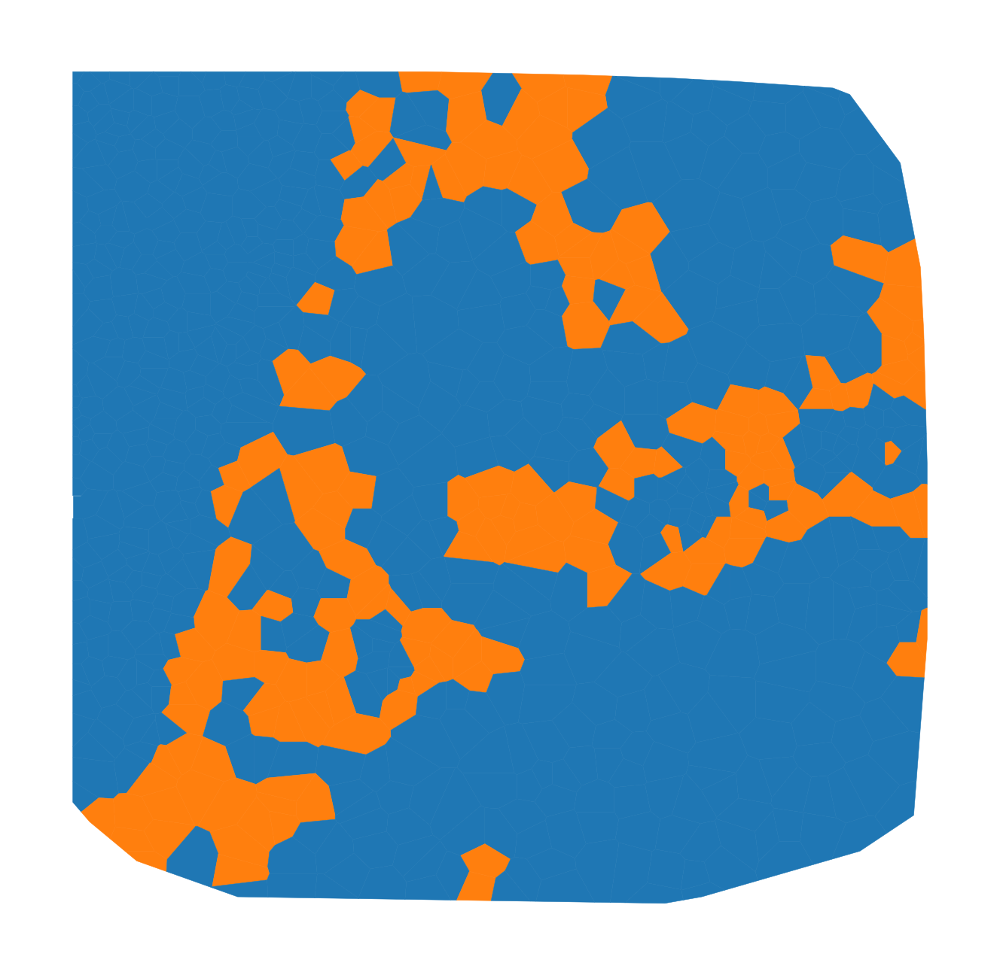

In [324]:
adata_plot = adata[adata.obs['batch']=='0']

# cls_obs = 'interest_mask'
# spatial_obs = 'spatial'
plot_voronoi_by_adata(adata_plot,'interest_mask','spatial')

### plot not merge color

In [325]:
mask_adata_by_obs(adata,intest_ME,ME_cls_obs)

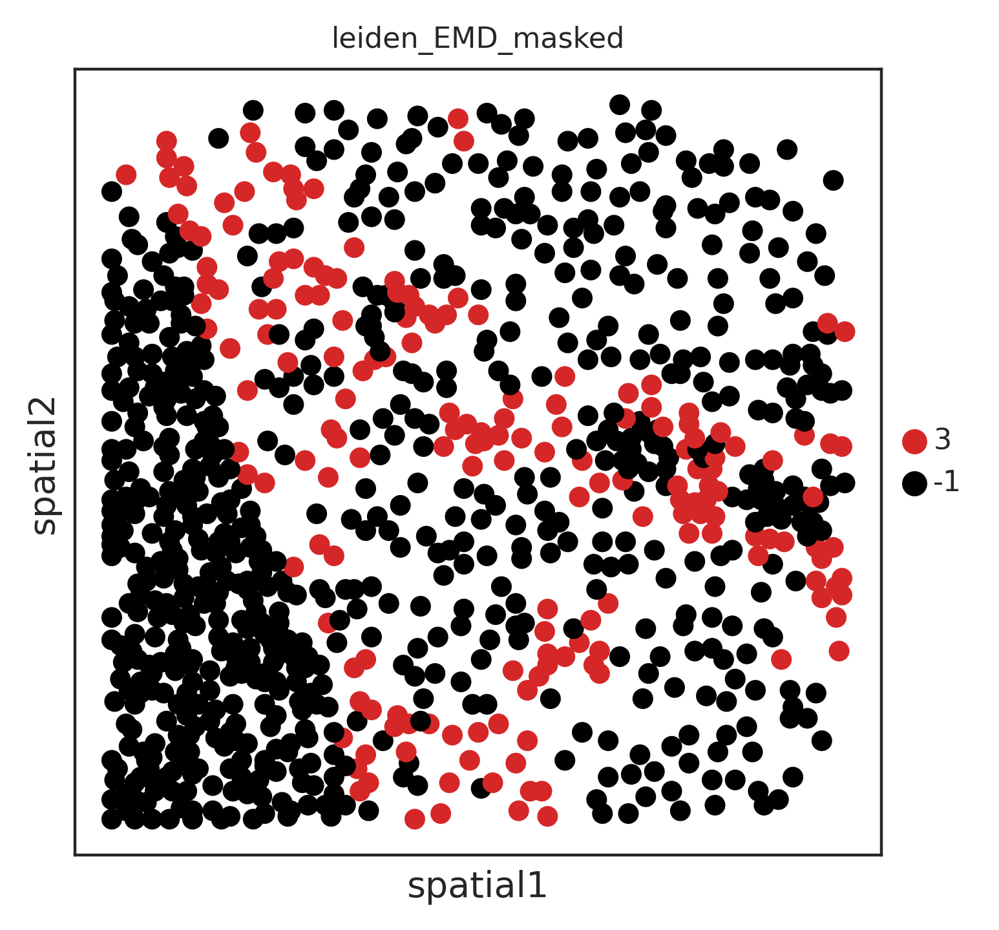

Trying to set attribute `.obsm` of view, copying.


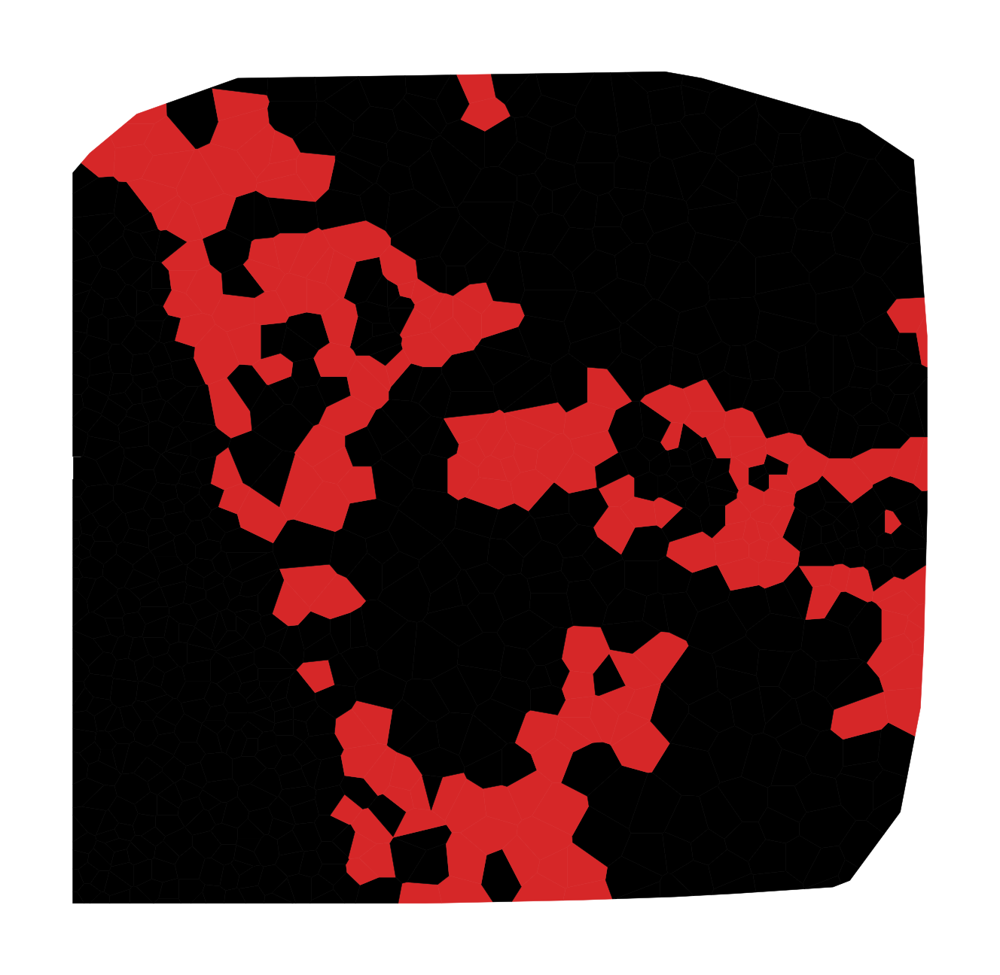

In [326]:
adata_plot = adata[adata.obs['batch']=='0']
masked_obs = ME_cls_obs
# cls_obs = 'interest_mask'
# spatial_obs = 'spatial'
plot_voronoi_by_adata(adata_plot,f'{masked_obs}_masked','spatial')

# plot ME all

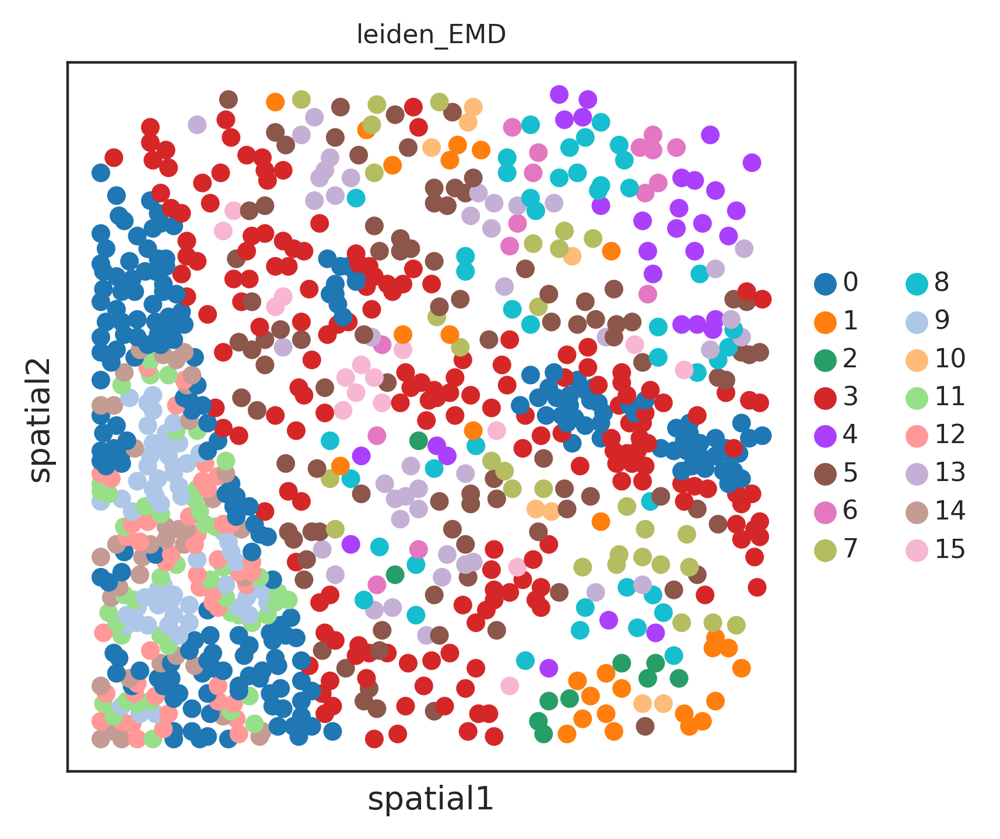

Trying to set attribute `.obsm` of view, copying.


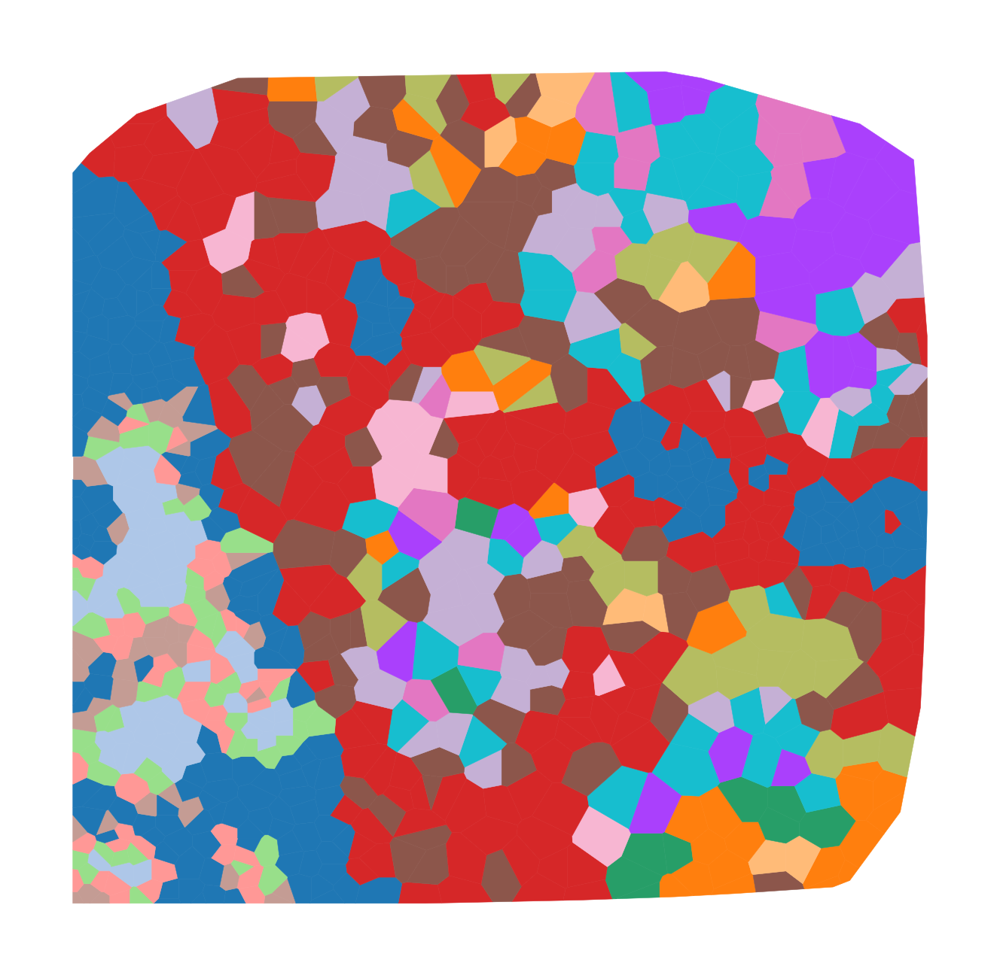

In [311]:
adata_plot = adata[adata.obs['batch']=='0']

# cls_obs = 'interest_mask'
# spatial_obs = 'spatial'
plot_voronoi_by_adata(adata_plot,ME_cls_obs,'spatial')